In [1]:

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from captum.attr import LayerGradCam, Occlusion
from datasets import load_dataset
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms


ds = load_dataset("pantelism/cats-vs-dogs")
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print(torch.cuda.current_device())
    print(torch.cuda.device_count())
    print(torch.cuda.get_device_name(0))

device

device(type='cpu')

In [2]:
class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(128, 128, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2)
        )
        self.classifier = nn.Sequential(
            nn.Linear(128 * 9 * 9, 1)
        )
    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

model = CNN()
model.load_state_dict(torch.load('cat_dog_cnn_model.pth'))
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
model.eval()

CNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (9): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Linear(in_features=10368, out_features=1, bias=True)
  )
)

In [3]:
target_layer = None
for m in reversed(model.features):
    if isinstance(m, torch.nn.Conv2d):
        target_layer = m
        break
target_layer

Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [4]:
def tensor_to_img(t):
    t = t.detach().cpu()
    t = t * 0.5 + 0.5
    t = torch.clamp(t, 0, 1)
    return np.transpose(t.numpy(), (1,2,0))

In [ ]:
def show_overlay(img_tensor, heatmap, alpha=0.25, cmap='jet', figsize=(8,4)):
    img = tensor_to_img(img_tensor)
    heatmap_norm = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    # Left: overlay
    axes[0].imshow(img)
    axes[0].imshow(heatmap_norm, cmap=cmap, alpha=alpha)
    axes[0].axis('off')
    axes[0].set_title('Overlay')
    # Right: original image
    axes[1].imshow(img)
    axes[1].axis('off')
    axes[1].set_title('Original')
    plt.tight_layout()
    plt.show()

In [6]:
@torch.no_grad()
def predict(model, x):
    return model(x)

In [ ]:
def forward_as_2logits(x):
    logit1 = model(x)
    logit0 = torch.zeros_like(logit1)
    return torch.cat([logit0, logit1], dim=1)

def gradcam_for_image(model, target_layer, img_tensor, target_class=None):
    device = next(model.parameters()).device
    model.eval()

    lgc = LayerGradCam(forward_as_2logits, target_layer)

    x = img_tensor.unsqueeze(0).to(device)
    logits2 = forward_as_2logits(x)
    probs = torch.softmax(logits2, dim=1)
    pred_cls = int(torch.argmax(probs, dim=1).item())
    cls = pred_cls if target_class is None else int(target_class)

    attributions = lgc.attribute(x, target=cls)
    attributions_upsampled = torch.nn.functional.interpolate(
        attributions, size=x.shape[-2:], mode="bilinear", align_corners=False
    )
    cam = attributions_upsampled.squeeze().detach().cpu().numpy()
    return cam, pred_cls, probs.squeeze().detach().cpu().numpy()


In [ ]:
import torch


class HFDataset(Dataset):
    def __init__(self, hf_ds, transform=None):
        self.ds = hf_ds
        self.transform = transform

    def __len__(self):
        return len(self.ds)

    def __getitem__(self, idx):
        item = self.ds[idx]
        img = item["image"].convert("RGB")
        if self.transform:
            img = self.transform(img)
        label = int(item["label"])
        return img, label

def make_test_loader(ds, batch_size=32, image_size=150, num_workers=0):
    """
    Returns a PyTorch DataLoader for the test split of the HF dataset `ds`.
    If `ds` lacks a 'test' split, it creates one with 80/10/10 (train/val/test).
    """
    if "train" in ds and "test" not in ds:
        split = ds["train"].train_test_split(test_size=0.2, seed=42)
        val_test = split["test"].train_test_split(test_size=0.5, seed=42)
        test_hf = val_test["test"]
    elif "test" in ds:
        test_hf = ds["test"]
    else:
        raise ValueError("Dataset must contain 'train' or 'test' split.")

    transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ])

    test_ds = HFDataset(test_hf, transform)
    test_loader = DataLoader(
        test_ds, batch_size=batch_size, shuffle=False,
        num_workers=num_workers, pin_memory=False
    )
    return test_loader


---
Image 1 (dataset idx=21) true label: 0 (cat)
--- Grad-CAM for layer 1 (Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 0 (cat) dog_prob≈ 0.0485084131360054


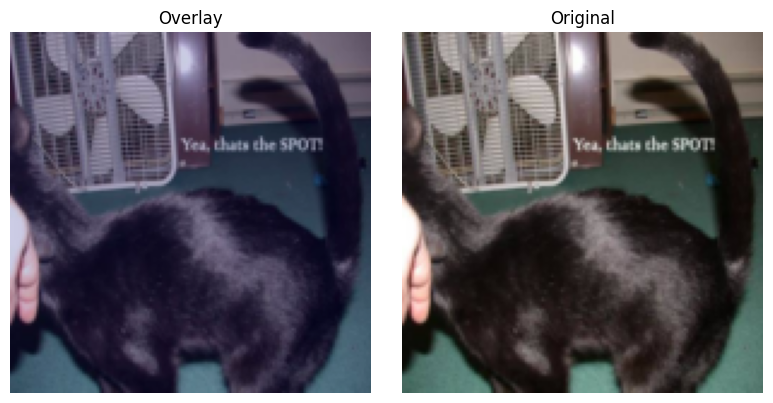

--- Grad-CAM for layer 2 (Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 0 (cat) dog_prob≈ 0.0485084131360054
Predicted: 0 (cat) dog_prob≈ 0.0485084131360054


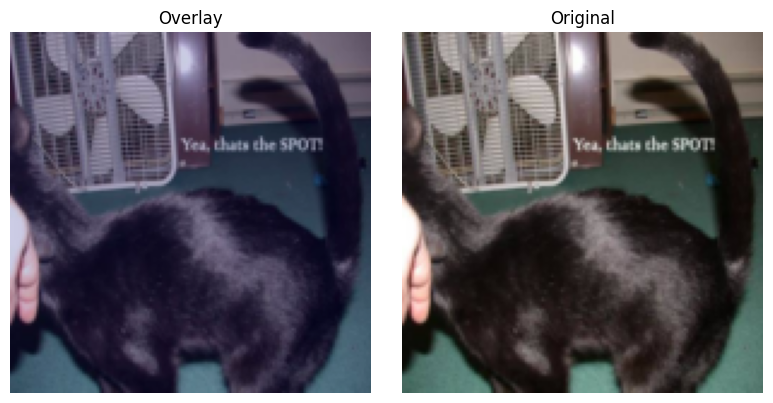

--- Grad-CAM for layer 3 (Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 0 (cat) dog_prob≈ 0.0485084131360054
Predicted: 0 (cat) dog_prob≈ 0.0485084131360054


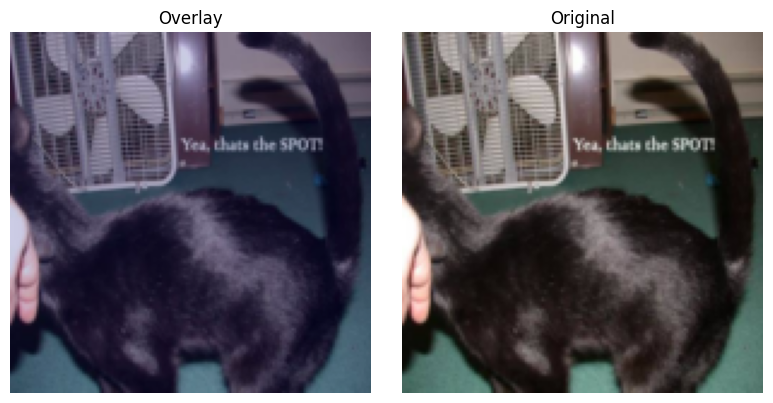

--- Grad-CAM for layer 4 (Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 0 (cat) dog_prob≈ 0.0485084131360054


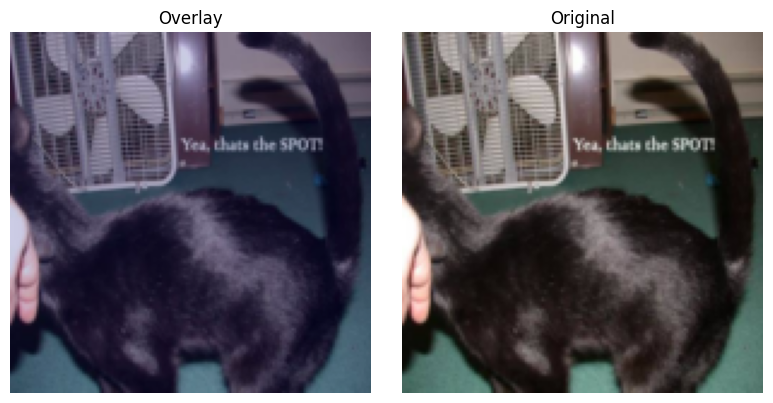

---
Image 2 (dataset idx=38) true label: 1 (dog)
--- Grad-CAM for layer 1 (Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 1 (dog) dog_prob≈ 0.789652943611145


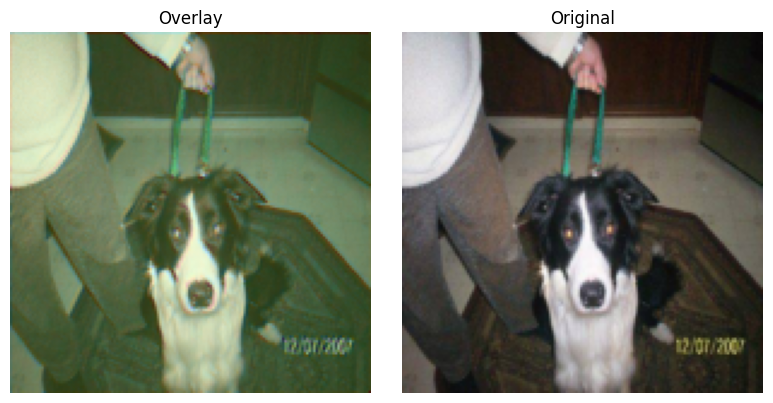

--- Grad-CAM for layer 2 (Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 1 (dog) dog_prob≈ 0.789652943611145


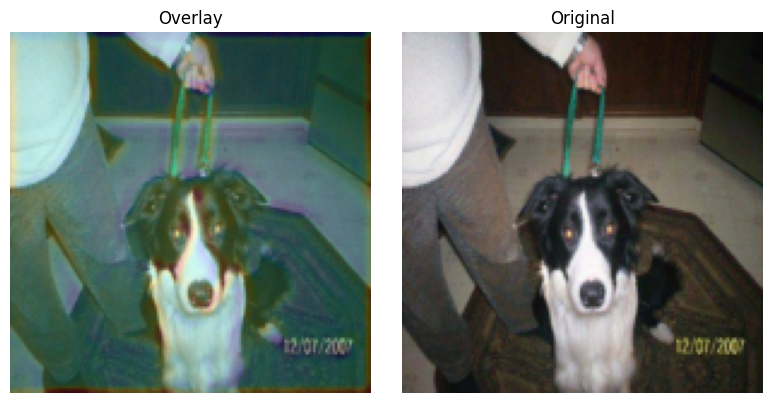

--- Grad-CAM for layer 3 (Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 1 (dog) dog_prob≈ 0.789652943611145


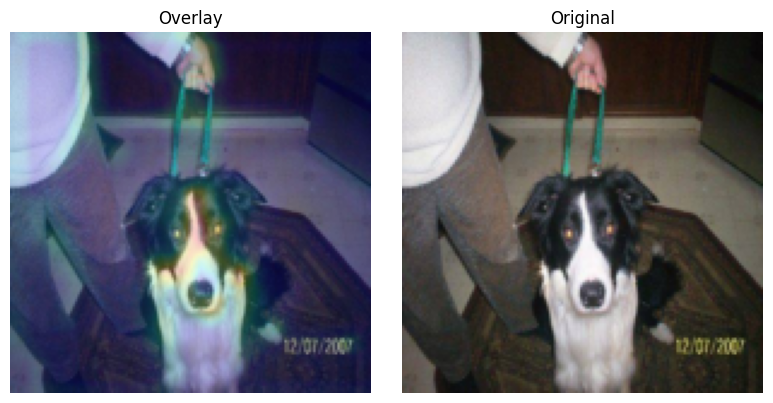

--- Grad-CAM for layer 4 (Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 1 (dog) dog_prob≈ 0.789652943611145


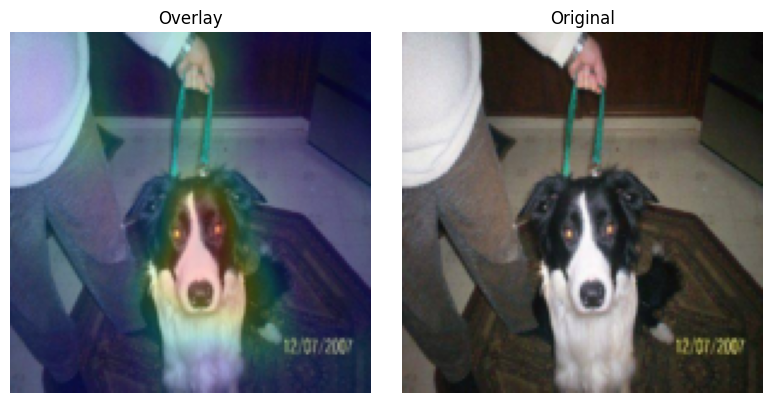

---
Image 3 (dataset idx=22) true label: 1 (dog)
--- Grad-CAM for layer 1 (Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 1 (dog) dog_prob≈ 0.5253769159317017


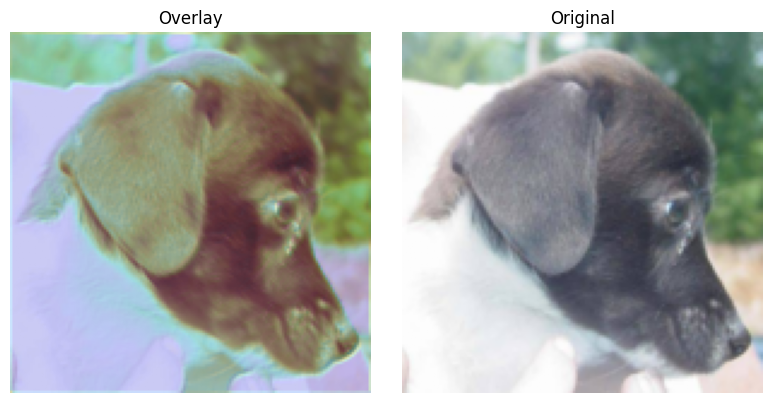

--- Grad-CAM for layer 2 (Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 1 (dog) dog_prob≈ 0.5253769159317017
Predicted: 1 (dog) dog_prob≈ 0.5253769159317017


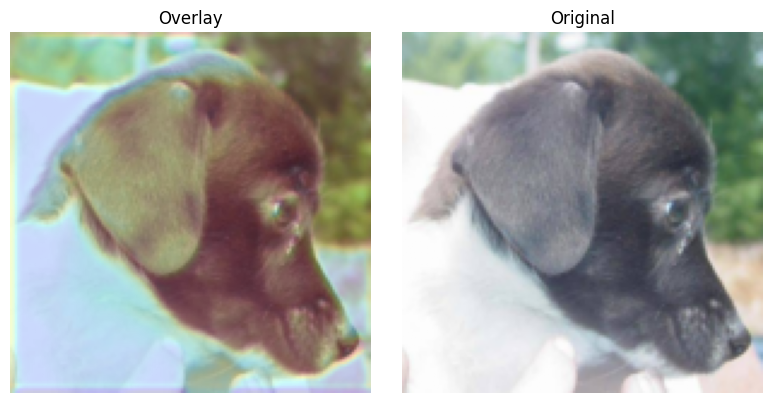

--- Grad-CAM for layer 3 (Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 1 (dog) dog_prob≈ 0.5253769159317017


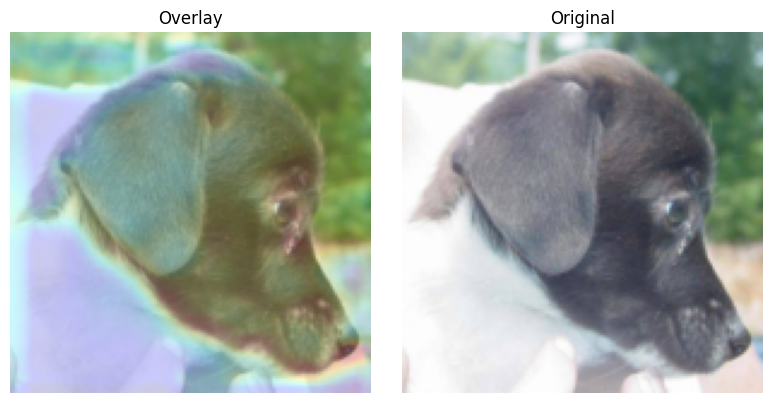

--- Grad-CAM for layer 4 (Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))) ---
Predicted: 1 (dog) dog_prob≈ 0.5253769159317017


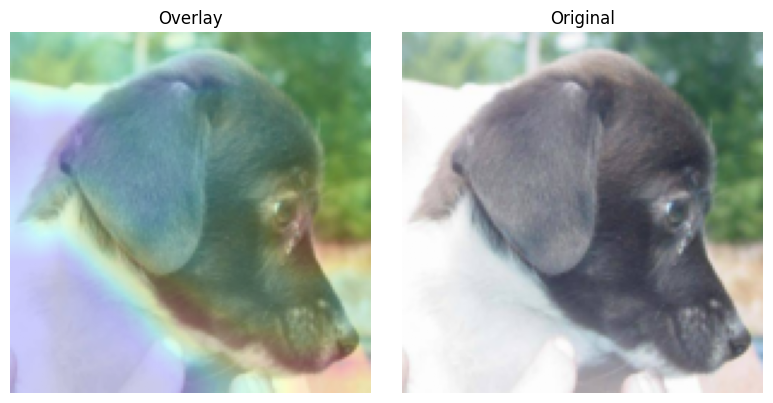

In [ ]:
ds = load_dataset("pantelism/cats-vs-dogs")
split = ds['train'].train_test_split(test_size=0.2, seed=42)
val_test = split['test'].train_test_split(test_size=0.5, seed=42)
test_dataset = val_test['test']
transform = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
test_ds = HFDataset(test_dataset, transform)
test_loader = DataLoader(test_ds, batch_size=32, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=32, shuffle=False)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNN().to(device)
model.load_state_dict(torch.load('cat_dog_cnn_model.pth'))
model.eval()
conv2d_layers = [m for m in model.features.modules() if isinstance(m, nn.Conv2d)]

n = len(test_loader.dataset)
k = min(3, n)
idxs = torch.randperm(n)[:k].tolist()

class_names = ['cat', 'dog']
for i, idx in enumerate(idxs):
    img, lbl = test_loader.dataset[idx]
    print('---')
    print(f'Image {i+1} (dataset idx={idx}) true label: {int(lbl)} ({class_names[int(lbl)]})')
    for layer_idx, target_layer in enumerate(conv2d_layers):
        print(f'--- Grad-CAM for layer {layer_idx+1} ({target_layer}) ---')
        cam, pred_cls, probs = gradcam_for_image(model, target_layer, img)
        try:
            dog_prob = float(probs[1])
        except Exception:
            dog_prob = float(probs) if hasattr(probs, '__float__') else None
        print(f'Predicted: {pred_cls} ({class_names[pred_cls]})', 'dog_prob≈', dog_prob)
        show_overlay(img, cam, alpha=0.2)


To be honest the first iteration of this was not that good. 

The first layer does seem to work in identifying actual shapes. It accurately recognize simple patterns like edges, corners, color gradients, and simple textures.

The second layer seems to start combining those shapes into more complex things. In some iterations you can see it recognize patterns like "eye-like circles," "ear shapes," or "snout-like textures." Though it sometimes gets confused by noise.

The third layer I thought would start moving from recognizing general shapes to identifying features that are more characteristic of the classes it's trying to distinguish, such as "cat faces" or "dog snouts. However, this one I think is the one that gets the most lost sometimes. It actually got very good at identifying legs, but that was about it.

If the 3rd layer was good at legs, this one is best; however, it failed at identifying snouts in many occassions. In the random sampling, sometimes we get lucky and we see it identify very accurately eyes, noses, and snouts. However, lot's of the time this fails.

In [20]:
def prob_dog(model, img_tensor, device):
    with torch.no_grad():
        logit = model(img_tensor.unsqueeze(0).to(device))
        return torch.sigmoid(logit)[0,0].item()


In [ ]:
def occlusion_map_for_image(
    model,
    img_tensor,
    sliding_window=15,
    stride=8,
    baseline="gray",
    target_class=None,
    aggregate="mean",
    perturbations_per_eval=16
):
    device = next(model.parameters()).device
    model.eval()

    if isinstance(baseline, str):
        b = baseline.lower()
        if b == "gray":
            base_val = 0.0
        elif b == "black":
            base_val = -1.0
        elif b == "white":
            base_val = 1.0
        else:
            raise ValueError()
    else:
        base_val = float(baseline)

    def forward_as_2logits(x):
        logit1 = model(x)
        logit0 = torch.zeros_like(logit1)
        return torch.cat([logit0, logit1], dim=1)

    x = img_tensor.unsqueeze(0).to(device)
    with torch.no_grad():
        logits2 = forward_as_2logits(x)
        probs2  = F.softmax(logits2, dim=1)
        pred_cls = int(torch.argmax(probs2, dim=1).item())
        cls = pred_cls if target_class is None else int(target_class)

    occ = Occlusion(forward_as_2logits)
    attributions = occ.attribute(
        x,
        strides=(1, stride, stride),
        sliding_window_shapes=(x.shape[1], sliding_window, sliding_window),
        baselines=base_val,
        target=cls,
        perturbations_per_eval=perturbations_per_eval,
    )

    A = attributions.squeeze(0)
    if aggregate == "mean":
        heat = A.mean(dim=0)
    elif aggregate == "sum":
        heat = A.sum(dim=0)
    elif aggregate == "max":
        heat, _ = A.max(dim=0)
    else:
        raise ValueError()

    heatmap = heat.detach().cpu().numpy()
    probs_np = probs2.squeeze(0).detach().cpu().numpy()
    return heatmap, pred_cls, probs_np



In [ ]:
def mask_top_patch(img_tensor, heatmap, win, baseline=0.0):
    H, W = heatmap.shape
    cy, cx = np.unravel_index(np.argmax(heatmap), (H, W))
    r0 = max(cy - win//2, 0); r1 = min(r0 + win, H)
    c0 = max(cx - win//2, 0); c1 = min(c0 + win, W)
    occluded = img_tensor.clone()
    occluded[:, r0:r1, c0:c1] = baseline
    return occluded, (r0, r1, c0, c1)


In [ ]:
def center_mask(img_tensor, mask_size, baseline=0.0):
    occluded = img_tensor.clone()
    _, H, W = occluded.shape
    r0 = max((H - mask_size)//2, 0); r1 = min(r0 + mask_size, H)
    c0 = max((W - mask_size)//2, 0); c1 = min(c0 + mask_size, W)
    occluded[:, r0:r1, c0:c1] = baseline
    return occluded, (r0, r1, c0, c1)


Selected random indices: [187, 117, 182]

---
Image 1 (dataset idx=187) | true=0 (cat)
Base prob(dog) = 0.137
Occlusion (win=25) predicted=0 (cat), softmax=[cat:0.863, dog:0.137]


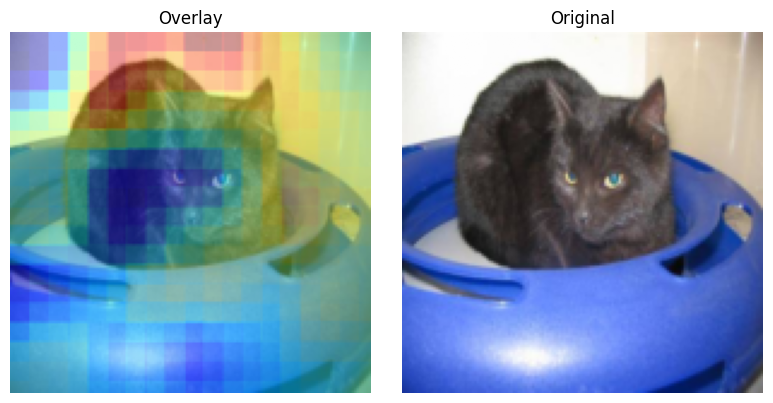

A) Top-patch mask (win=25, box=(0, 25, 69, 94)) -> prob(dog): 0.081  Δ=-0.055


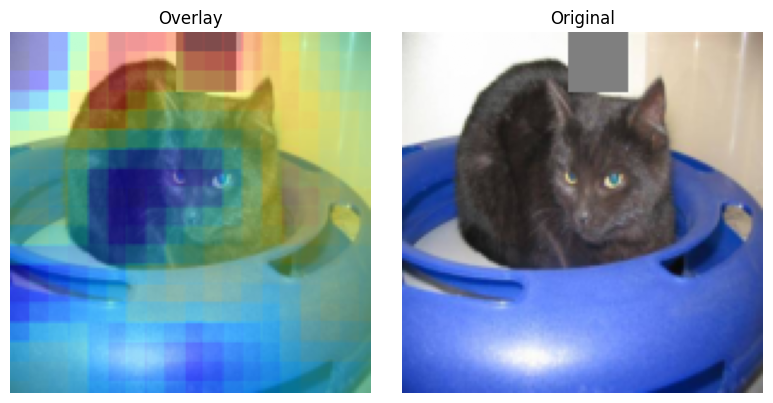

B) Center mask 15 -> prob(dog): 0.148  Δ=+0.011  box=(67, 82, 67, 82)


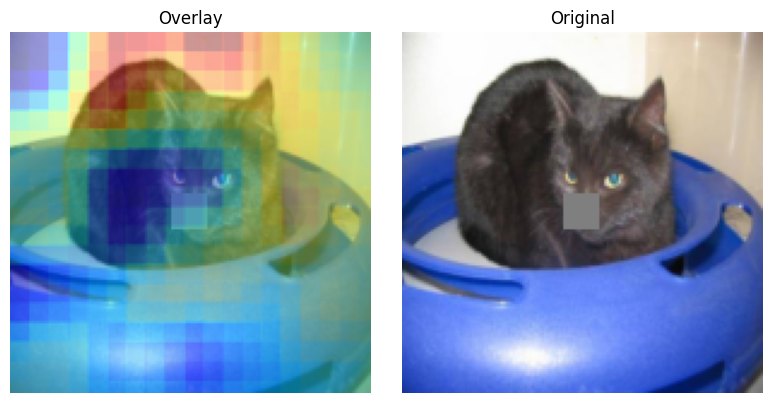

B) Center mask 25 -> prob(dog): 0.183  Δ=+0.046  box=(62, 87, 62, 87)


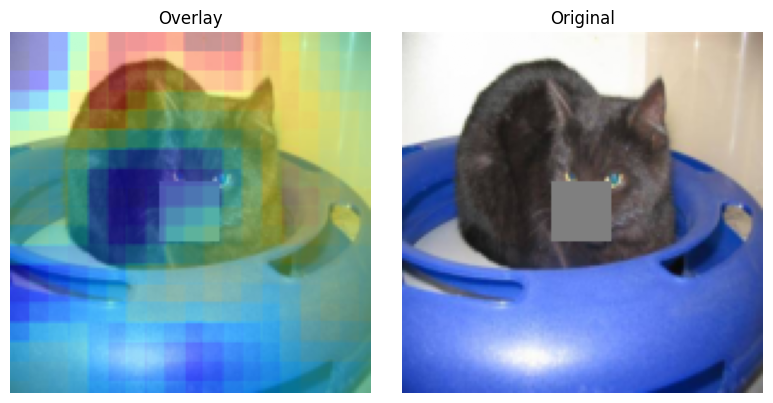

B) Center mask 35 -> prob(dog): 0.217  Δ=+0.080  box=(57, 92, 57, 92)


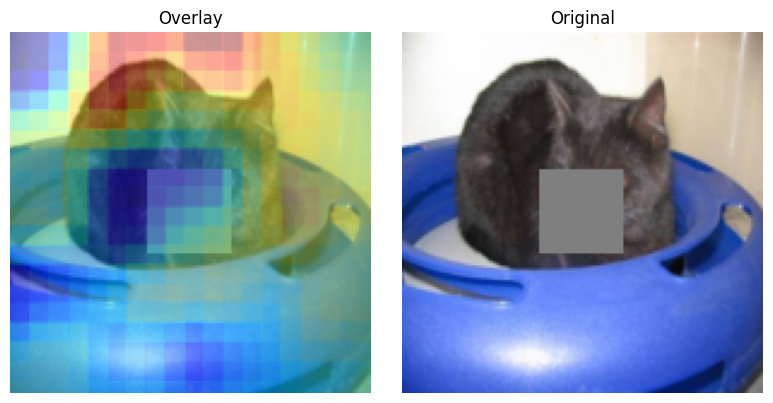


---
Image 2 (dataset idx=117) | true=1 (dog)
Base prob(dog) = 0.631
Occlusion (win=25) predicted=1 (dog), softmax=[cat:0.369, dog:0.631]


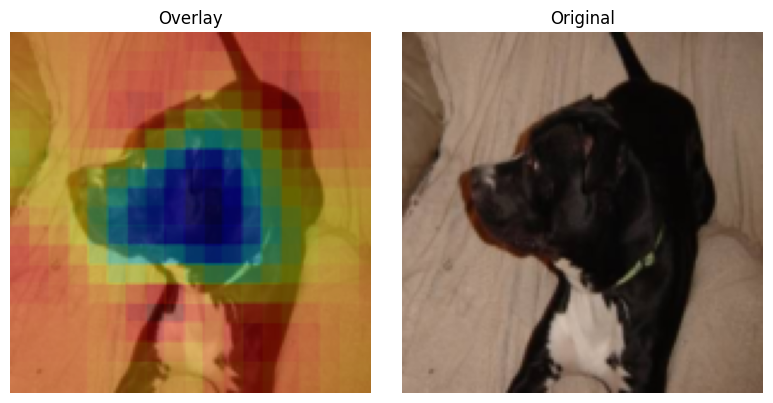

A) Top-patch mask (win=25, box=(101, 126, 45, 70)) -> prob(dog): 0.499  Δ=-0.132


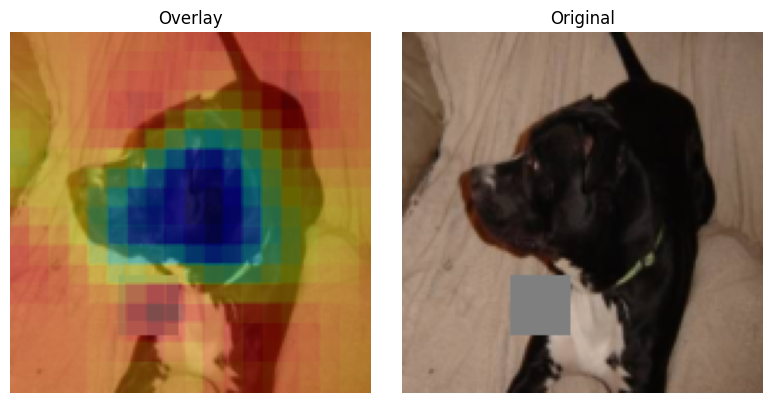

B) Center mask 15 -> prob(dog): 0.721  Δ=+0.089  box=(67, 82, 67, 82)


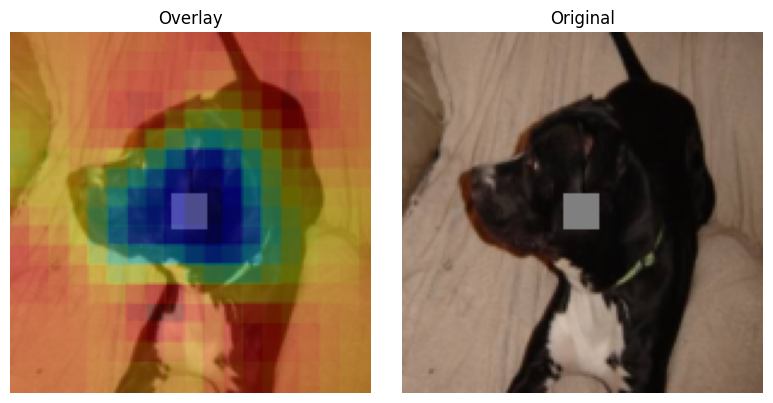

B) Center mask 25 -> prob(dog): 0.828  Δ=+0.196  box=(62, 87, 62, 87)


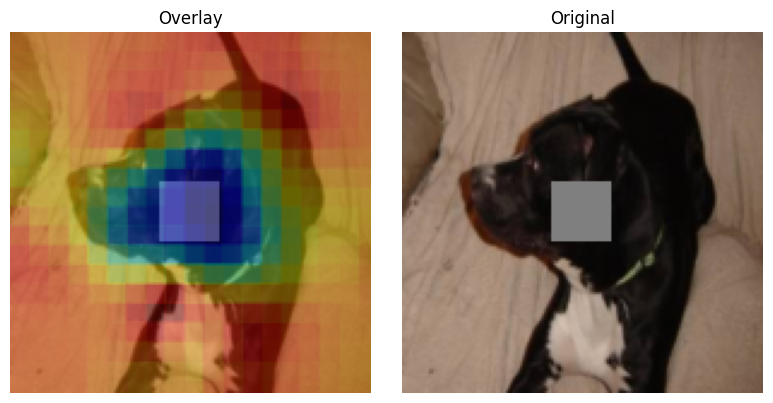

B) Center mask 35 -> prob(dog): 0.887  Δ=+0.256  box=(57, 92, 57, 92)


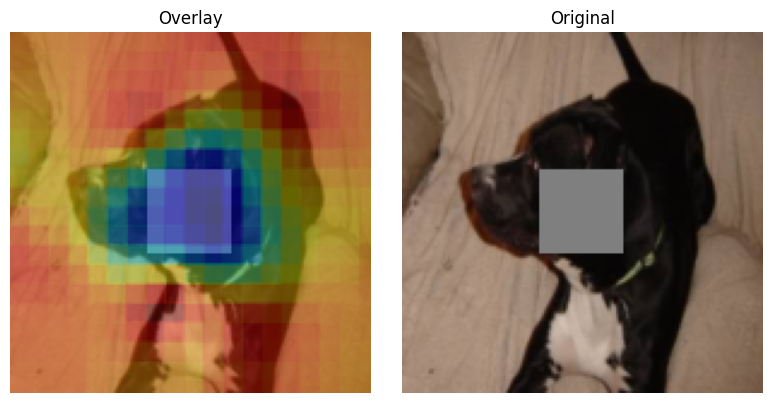


---
Image 3 (dataset idx=182) | true=0 (cat)
Base prob(dog) = 0.839
Occlusion (win=25) predicted=1 (dog), softmax=[cat:0.161, dog:0.839]


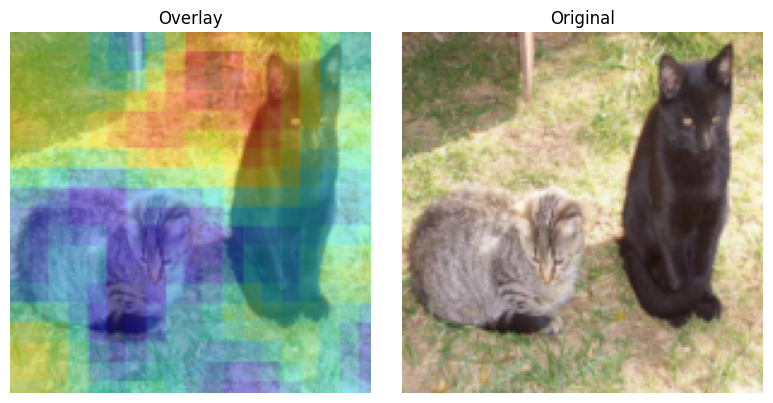

A) Top-patch mask (win=25, box=(4, 29, 69, 94)) -> prob(dog): 0.749  Δ=-0.091


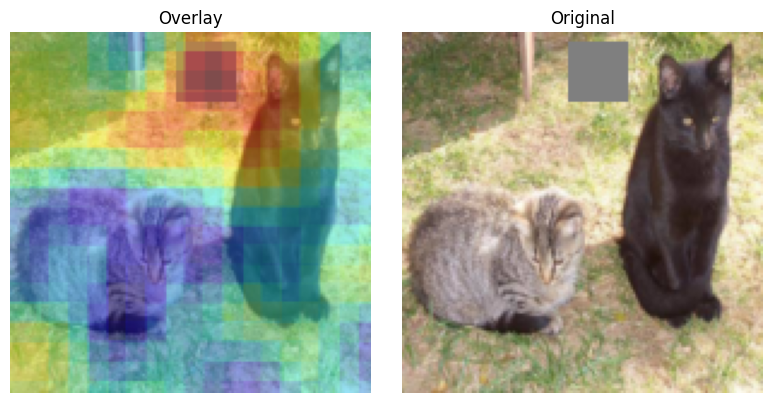

B) Center mask 15 -> prob(dog): 0.853  Δ=+0.014  box=(67, 82, 67, 82)


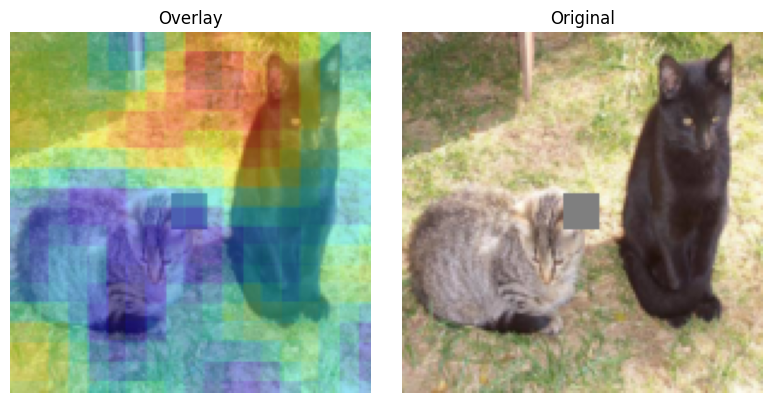

B) Center mask 25 -> prob(dog): 0.874  Δ=+0.034  box=(62, 87, 62, 87)


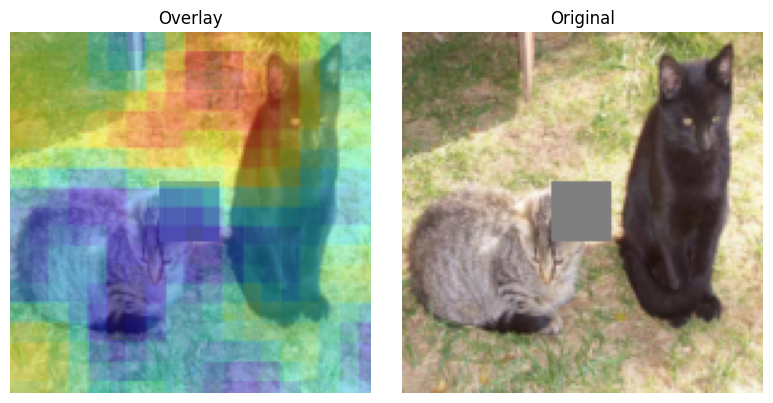

B) Center mask 35 -> prob(dog): 0.875  Δ=+0.036  box=(57, 92, 57, 92)


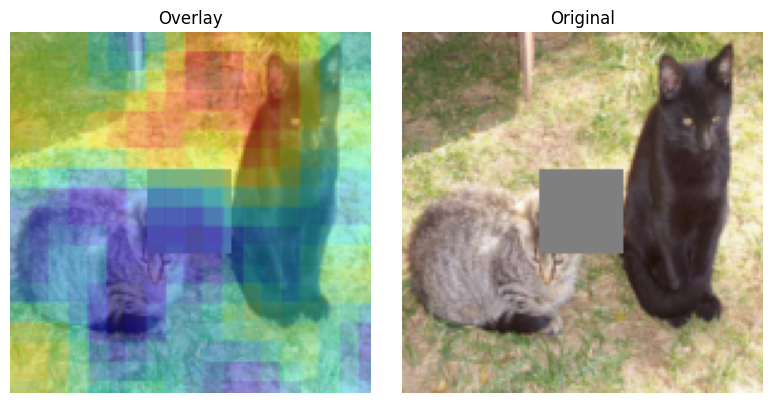

In [ ]:
class_names = ['cat', 'dog']
n = len(test_loader.dataset)
k = min(3, n)
idxs = torch.randperm(n)[:k].tolist()
print("Selected random indices:", idxs)

for i, idx in enumerate(idxs, 1):
    img, lbl = test_loader.dataset[idx]
    print("\n---")
    print(f"Image {i} (dataset idx={idx}) | true={lbl} ({class_names[lbl]})")

    p_base = prob_dog(model, img, device)
    print(f"Base prob(dog) = {p_base:.3f}")

    win = 25
    heatmap, pred_cls, probs2 = occlusion_map_for_image(
        model, img, sliding_window=win, stride=8, baseline="gray", target_class=1
    )
    print(f"Occlusion (win={win}) predicted={pred_cls} ({class_names[pred_cls]}), softmax=[cat:{probs2[0]:.3f}, dog:{probs2[1]:.3f}]")
    show_overlay(img, heatmap, alpha=0.4)

    img_top, box = mask_top_patch(img, heatmap, win=win, baseline=0.0)
    p_top = prob_dog(model, img_top, device)
    print(f"A) Top-patch mask (win={win}, box={box}) -> prob(dog): {p_top:.3f}  Δ={p_top - p_base:+.3f}")
    show_overlay(img_top, heatmap, alpha=0.4)

    for cwin in [15, 25, 35]:
        img_c, cbox = center_mask(img, cwin, baseline=0.0)
        p_c = prob_dog(model, img_c, device)
        print(f"B) Center mask {cwin} -> prob(dog): {p_c:.3f}  Δ={p_c - p_base:+.3f}  box={cbox}")
        show_overlay(img_c, heatmap, alpha=0.4)
